# Imports and Setup


In [ ]:
import subprocess
import sys

subprocess.run([sys.executable, "-m", "pip", "install", "--upgrade", "pip", "-q"], check=True)
subprocess.run([sys.executable, "-m", "pip", "install", "ultralytics", "pyyaml", "-q"], check=True)
print("Ultralytics and YAML support are ready.")


Ultralytics and YAML support are ready.


In [ ]:
from pathlib import Path

sam2_repo_dir = "/home/vteam5/sam2"
if not Path(sam2_repo_dir).exists():
    !git clone https://github.com/facebookresearch/sam2.git "{sam2_repo_dir}" -q
else:
    print("SAM 2 repository already exists.")

%cd /home/vteam5/sam2
subprocess.run([sys.executable, "-m", "pip", "install", "-e", ".", "-q"], check=True)
subprocess.run([sys.executable, "-m", "pip", "install", "opencv-python-headless", "matplotlib", "seaborn", "-q"], check=True)
print("SAM 2 and plotting tools are ready.")


SAM 2 repository already exists.
/home/vteam5/sam2
SAM 2 and plotting tools are ready.


In [ ]:
import os
import sys
import json
import random
import shutil
import xml.etree.ElementTree as ElementTree
from pathlib import Path

import cv2
import yaml
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torch

from ultralytics import YOLO

random.seed(42)
np.random.seed(42)
torch.manual_seed(42)


### GPU Check


In [ ]:
gpu_available = torch.cuda.is_available()
device_name = torch.cuda.get_device_name(0) if gpu_available else "CPU"
compute_device = "cuda" if gpu_available else "cpu"

print(f"GPU available: {gpu_available}")
print(f"Active device: {device_name}")


GPU available: True
Active device: Quadro RTX 4000


## Extract Dataset and Create Paths


In [ ]:
project_root = Path("/home/vteam5/multispectral_pedestrian_ensemble")
llvip_dir = project_root / "llvip_dataset"
model_checkpoints_dir = project_root / "model_checkpoints"
processed_dataset_dir = project_root / "processed_dataset"
results_dir = project_root / "results"
detection_results_dir = project_root / "results_detection"
ensemble_results_dir = project_root / "results_ensemble_v2"

for directory in [project_root, llvip_dir, model_checkpoints_dir,
                  processed_dataset_dir, results_dir,
                  detection_results_dir, ensemble_results_dir]:
    directory.mkdir(parents=True, exist_ok=True)

llvip_infrared_train_dir = llvip_dir / "infrared" / "train"
llvip_visible_train_dir = llvip_dir / "visible" / "train"
llvip_annotations_dir = llvip_dir / "Annotations"

llvip_zip = project_root / "LLVIP.zip"
if not llvip_zip.exists():
    raise FileNotFoundError(f"Upload LLVIP.zip to {project_root} before running this notebook.")

if not llvip_infrared_train_dir.exists():
    print("Extracting LLVIP archive. This only runs when the dataset is missing.")
    !unzip -q "{llvip_zip}" -d "{llvip_dir}"

    for expected in ["infrared", "visible", "Annotations"]:
        if not (llvip_dir / expected).exists():
            nested = list(llvip_dir.glob(f"*/{expected}"))
            if nested:
                nested_root = nested[0].parent
                for item in nested_root.iterdir():
                    shutil.move(str(item), str(llvip_dir / item.name))
                nested_root.rmdir()
                break
    print("Dataset extraction finished.")
else:
    print("LLVIP dataset already extracted.")


LLVIP dataset already extracted.


## Path Configuration


In [ ]:
data_yaml_path = processed_dataset_dir / "data.yaml"

if data_yaml_path.exists():
    with open(data_yaml_path) as f:
        data_config = yaml.safe_load(f)

    print("data.yaml found:")
    for key, value in data_config.items():
        print(f"  {key}: {value}")
else:
    print(f"data.yaml will be created during preprocessing: {data_yaml_path}")

train_image_dir = processed_dataset_dir / "train" / "images"
val_image_dir = processed_dataset_dir / "val" / "images"
n_train_saved = len(list(train_image_dir.glob("*.jpg"))) if train_image_dir.exists() else 0
n_val_saved = len(list(val_image_dir.glob("*.jpg"))) if val_image_dir.exists() else 0
print(f"Saved training images: {n_train_saved}")
print(f"Saved validation images: {n_val_saved}")


data.yaml found:
  path: /home/vteam5/multispectral_pedestrian_ensemble/processed_dataset
  train: train/images
  val: val/images
  nc: 1
  names: ['Pedestrian']
Saved training images: 10221
Saved validation images: 1804


# Data Exploration & Alignment Check

In [ ]:
all_ir_train = sorted(llvip_infrared_train_dir.glob("*.jpg"))
all_vis_train = sorted(llvip_visible_train_dir.glob("*.jpg"))
print(f"Infrared training images: {len(all_ir_train)}")
print(f"Visible training images: {len(all_vis_train)}")


Infrared training images: 12025
Visible training images: 12025


In [ ]:
ir_stems = {p.stem for p in all_ir_train}
vis_stems = {p.stem for p in all_vis_train}
ir_only = ir_stems - vis_stems
vis_only = vis_stems - ir_stems

if not ir_only and not vis_only:
    print("Alignment check passed. Every IR image has a matching visible pair.")
else:
    print(f"Alignment check failed. IR-only: {len(ir_only)} | visible-only: {len(vis_only)}")


Alignment check passed. Every IR image has a matching visible pair.


In [ ]:
sample_idx = random.sample(range(len(all_ir_train)), 3)
print(f"Selected {len(sample_idx)} image pairs for the alignment plot.")


Selected 3 image pairs for the alignment plot.


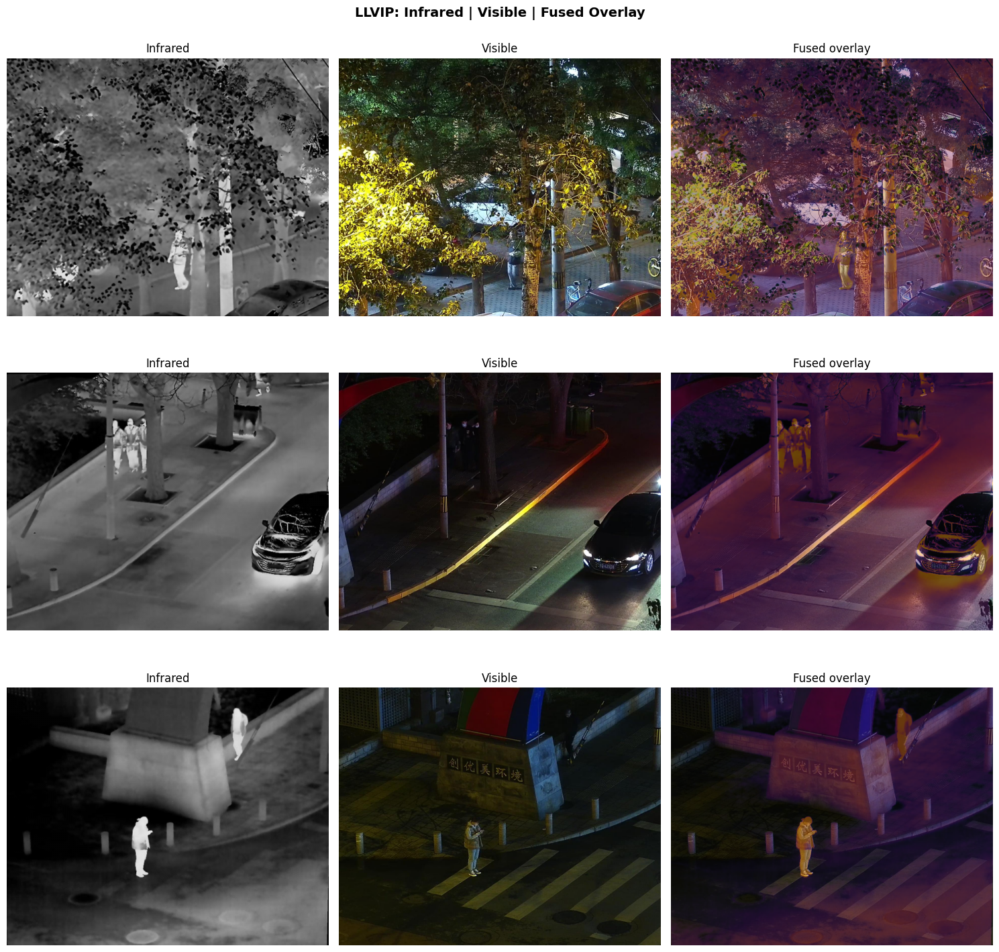

In [ ]:
fig, axes = plt.subplots(3, 3, figsize=(15, 15))
fig.suptitle("LLVIP: Infrared | Visible | Fused Overlay", fontsize=14, fontweight="bold")

for row, idx in enumerate(sample_idx):
    ir_gray = cv2.imread(str(all_ir_train[idx]), cv2.IMREAD_GRAYSCALE)
    vis_bgr = cv2.imread(str(all_vis_train[idx]))
    if ir_gray is None or vis_bgr is None:
        raise FileNotFoundError(f"Could not read pair: {all_ir_train[idx].name}")

    vis_rgb = cv2.cvtColor(vis_bgr, cv2.COLOR_BGR2RGB)
    heatmap = cv2.applyColorMap(ir_gray, cv2.COLORMAP_INFERNO)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    vis_resized = cv2.resize(vis_rgb, (ir_gray.shape[1], ir_gray.shape[0]))
    fused_overlay = cv2.addWeighted(vis_resized, 0.6, heatmap, 0.4, 0)

    axes[row, 0].imshow(ir_gray, cmap="gray")
    axes[row, 0].set_title("Infrared")
    axes[row, 0].axis("off")

    axes[row, 1].imshow(vis_rgb)
    axes[row, 1].set_title("Visible")
    axes[row, 1].axis("off")

    axes[row, 2].imshow(fused_overlay)
    axes[row, 2].set_title("Fused overlay")
    axes[row, 2].axis("off")

plt.tight_layout()
alignment_plot_path = results_dir / "section4_alignment_check.png"
plt.savefig(alignment_plot_path, dpi=150, bbox_inches="tight")
plt.show()


In [ ]:
print(f"Saved alignment plot: {alignment_plot_path}")


Saved alignment plot: /home/vteam5/multispectral_pedestrian_ensemble/results/section4_alignment_check.png


# Preprocessing: Fusion, Label Conversion, data.yaml


In [ ]:
TARGET_RES = 1024
CLASS_ID = 0
TRAIN_RATIO = 0.85


In [ ]:
for split in ["train", "val"]:
    for subfolder in ["images", "labels"]:
        (processed_dataset_dir / split / subfolder).mkdir(parents=True, exist_ok=True)


In [ ]:
def convert_voc_xml_to_yolo(xml_path: Path, label_path: Path, fallback_w: int, fallback_h: int) -> int:
    """Convert one LLVIP XML annotation into one YOLO label file."""
    root = ElementTree.parse(str(xml_path)).getroot()

    size_node = root.find("size")
    if size_node is not None and size_node.find("width") is not None and size_node.find("height") is not None:
        image_w = int(float(size_node.find("width").text))
        image_h = int(float(size_node.find("height").text))
    else:
        image_w, image_h = fallback_w, fallback_h

    lines = []
    for obj in root.findall("object"):
        bb = obj.find("bndbox")
        xmin = float(bb.find("xmin").text)
        ymin = float(bb.find("ymin").text)
        xmax = float(bb.find("xmax").text)
        ymax = float(bb.find("ymax").text)

        cx = ((xmin + xmax) / 2) / image_w
        cy = ((ymin + ymax) / 2) / image_h
        bw = (xmax - xmin) / image_w
        bh = (ymax - ymin) / image_h
        cx, cy, bw, bh = [min(max(v, 0.0), 1.0) for v in (cx, cy, bw, bh)]
        lines.append(f"{CLASS_ID} {cx:.6f} {cy:.6f} {bw:.6f} {bh:.6f}")

    label_path.write_text("\n".join(lines))
    return len(lines)


In [ ]:
def create_fused_image(ir_path: Path, vis_path: Path, res: int = TARGET_RES) -> np.ndarray:
    """Create the saved YOLO input: IR plus visible green and blue channels."""
    ir_gray = cv2.imread(str(ir_path), cv2.IMREAD_GRAYSCALE)
    vis_bgr = cv2.imread(str(vis_path))
    if ir_gray is None or vis_bgr is None:
        raise FileNotFoundError(f"Could not read pair: {ir_path.name}")

    ir_resized = cv2.resize(ir_gray, (res, res), interpolation=cv2.INTER_AREA)
    vis_resized = cv2.resize(vis_bgr, (res, res), interpolation=cv2.INTER_AREA)
    return np.stack([ir_resized, vis_resized[:, :, 1], vis_resized[:, :, 0]], axis=2).astype(np.uint8)


In [ ]:
paired_stems = [p.stem for p in all_ir_train
                if (llvip_visible_train_dir / (p.stem + ".jpg")).exists()]

random.seed(42)
random.shuffle(paired_stems)
n_train = int(len(paired_stems) * TRAIN_RATIO)
split_stems = {"train": paired_stems[:n_train], "val": paired_stems[n_train:]}

print(f"Total pairs: {len(paired_stems)}")
print(f"Training split: {len(split_stems['train'])}")
print(f"Validation split: {len(split_stems['val'])}")


Total pairs: 12025
Training split: 10221
Validation split: 1804


In [ ]:
expected_train = len(split_stems["train"])
expected_val = len(split_stems["val"])
current_train_images = len(list((processed_dataset_dir / "train" / "images").glob("*.jpg")))
current_train_labels = len(list((processed_dataset_dir / "train" / "labels").glob("*.txt")))
current_val_images = len(list((processed_dataset_dir / "val" / "images").glob("*.jpg")))
current_val_labels = len(list((processed_dataset_dir / "val" / "labels").glob("*.txt")))

preprocessing_complete = (
    current_train_images >= expected_train and current_train_labels >= expected_train and
    current_val_images >= expected_val and current_val_labels >= expected_val
)

if preprocessing_complete:
    print("Processed dataset already looks complete. Skipping image and label creation.")
else:
    print("Creating missing fused images and YOLO labels.")
    total_imgs = 0
    total_boxes = 0

    for split, stems in split_stems.items():
        split_img_dir = processed_dataset_dir / split / "images"
        split_label_dir = processed_dataset_dir / split / "labels"

        for stem in stems:
            image_out = split_img_dir / f"{stem}.jpg"
            label_out = split_label_dir / f"{stem}.txt"
            if image_out.exists() and label_out.exists():
                continue

            ir_src = llvip_infrared_train_dir / f"{stem}.jpg"
            vis_src = llvip_visible_train_dir / f"{stem}.jpg"
            xml_src = llvip_annotations_dir / f"{stem}.xml"
            if not xml_src.exists():
                continue

            fused = create_fused_image(ir_src, vis_src, TARGET_RES)
            cv2.imwrite(str(image_out), fused)
            boxes = convert_voc_xml_to_yolo(xml_src, label_out, TARGET_RES, TARGET_RES)
            total_imgs += 1
            total_boxes += boxes

        print(f"{split}: checked {len(stems)} images")

    print(f"Images created or repaired: {total_imgs}")
    print(f"Boxes written: {total_boxes}")


Processed dataset already looks complete. Skipping image and label creation.


In [ ]:
data_yaml_path = processed_dataset_dir / "data.yaml"
data_yaml = {
    "path": str(processed_dataset_dir),
    "train": "train/images",
    "val": "val/images",
    "nc": 1,
    "names": ["Pedestrian"],
}

with open(data_yaml_path, "w") as f:
    yaml.dump(data_yaml, f, default_flow_style=False, sort_keys=False)

print(f"data.yaml saved: {data_yaml_path}")


data.yaml saved: /home/vteam5/multispectral_pedestrian_ensemble/processed_dataset/data.yaml


# YOLO Detection

### Hyperparameters (V2 Improvement)


In [ ]:
yolo_model = "yolo11s.pt"
img_size = TARGET_RES
epochs = 50
batch_size = 8
patience = 10
workers = 8
lr0 = 0.01

conf_default = 0.25
nms_iou = 0.45
max_det = 100

# These HSV values are used only if this notebook trains from scratch
# --> Unused in our implementation --> Future work
hsv_h = 0.0
hsv_s = 0.0
hsv_v = 0.0
fliplr = 0.5
flipud = 0.0
degrees = 0.0
translate = 0.10
scale = 0.50
mosaic = 1.0
close_mosaic = 10

run_name = "member2_yolo11s_thermal_pedestrian"
existing_run_name = "pedestrian_multispectral_yolo11s"
print("YOLO settings are ready.")


YOLO settings are ready.


## Training

### Load or Train YOLOv11s (V2 Improvement)


In [ ]:
existing_checkpoint = results_dir / existing_run_name / "weights" / "best.pt"
new_checkpoint = detection_results_dir / run_name / "weights" / "best.pt"

if existing_checkpoint.exists():
    best_checkpoint_path = existing_checkpoint
    print(f"Using saved YOLO checkpoint: {best_checkpoint_path}")
elif new_checkpoint.exists():
    best_checkpoint_path = new_checkpoint
    print(f"Using notebook-trained YOLO checkpoint: {best_checkpoint_path}")
else:
    best_checkpoint_path = new_checkpoint
    print("No saved YOLO checkpoint found. The next cell will train from scratch.")


Using saved YOLO checkpoint: /home/vteam5/multispectral_pedestrian_ensemble/results/pedestrian_multispectral_yolo11s/weights/best.pt


In [ ]:
do_train = not best_checkpoint_path.exists()

if do_train:
    model = YOLO(yolo_model)
    results = model.train(
        data=str(data_yaml_path),
        imgsz=img_size,
        epochs=epochs,
        batch=batch_size,
        lr0=lr0,
        iou=nms_iou,
        conf=conf_default,
        patience=patience,
        workers=workers,
        hsv_h=hsv_h, hsv_s=hsv_s, hsv_v=hsv_v,
        fliplr=fliplr, flipud=flipud, degrees=degrees,
        translate=translate, scale=scale,
        mosaic=mosaic, close_mosaic=close_mosaic,
        name=run_name,
        project=str(detection_results_dir),
        device=compute_device,
        verbose=True,
    )
    best_checkpoint_path = new_checkpoint
    print(f"Training finished. Best checkpoint: {best_checkpoint_path}")
else:
    print("Training skipped because a checkpoint is already available.")


Training skipped because a checkpoint is already available.


### Training Curves (V2 Improvement)


Loaded training history: /home/vteam5/multispectral_pedestrian_ensemble/results/pedestrian_multispectral_yolo11s/results.csv


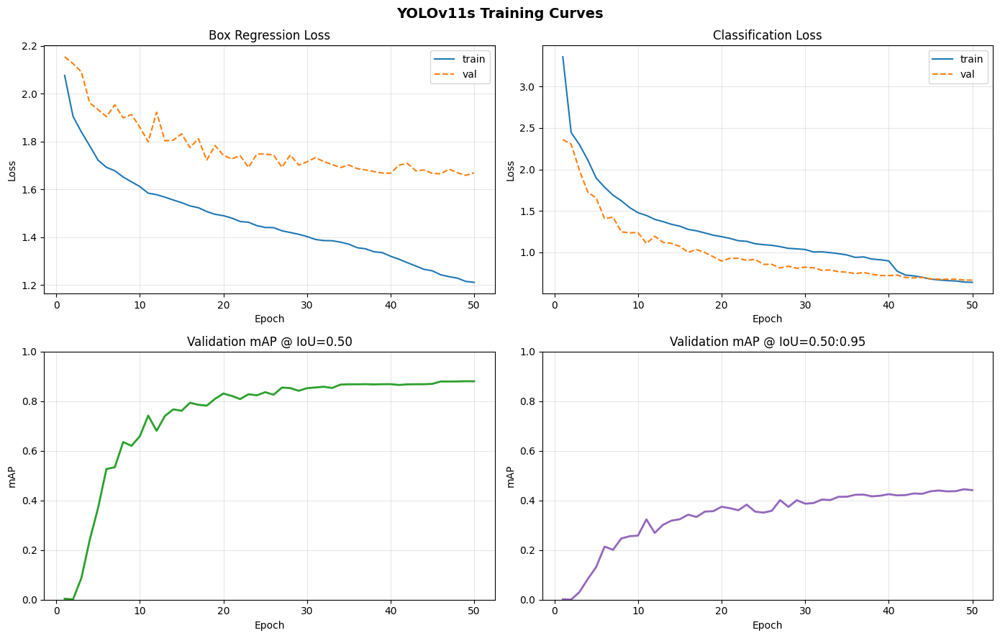

Final epoch: 50
  train/box_loss: 1.2115
  metrics/mAP50(B): 0.8803
  metrics/mAP50-95(B): 0.4415
  metrics/precision(B): 0.9286
  metrics/recall(B): 0.8875
Saved training curves: /home/vteam5/multispectral_pedestrian_ensemble/results_detection/training_curves.png


In [ ]:
candidate_csv_paths = [
    detection_results_dir / run_name / "results.csv",
    results_dir / existing_run_name / "results.csv",
]
results_csv = next((p for p in candidate_csv_paths if p.exists()), None)

if results_csv is None:
    print("Training results.csv was not found, so curves were not plotted.")
else:
    df = pd.read_csv(results_csv)
    df.columns = [c.strip() for c in df.columns]
    print(f"Loaded training history: {results_csv}")

    fig, axes = plt.subplots(2, 2, figsize=(14, 9))
    fig.suptitle("YOLOv11s Training Curves", fontsize=14, fontweight="bold")
    epochs_axis = df["epoch"]

    if "train/box_loss" in df.columns:
        axes[0, 0].plot(epochs_axis, df["train/box_loss"], label="train", color="tab:blue")
        if "val/box_loss" in df.columns:
            axes[0, 0].plot(epochs_axis, df["val/box_loss"], label="val", color="tab:orange", linestyle="--")
        axes[0, 0].set_title("Box Regression Loss")
        axes[0, 0].set_xlabel("Epoch"); axes[0, 0].set_ylabel("Loss")
        axes[0, 0].legend(); axes[0, 0].grid(alpha=0.3)

    if "train/cls_loss" in df.columns:
        axes[0, 1].plot(epochs_axis, df["train/cls_loss"], label="train", color="tab:blue")
        if "val/cls_loss" in df.columns:
            axes[0, 1].plot(epochs_axis, df["val/cls_loss"], label="val", color="tab:orange", linestyle="--")
        axes[0, 1].set_title("Classification Loss")
        axes[0, 1].set_xlabel("Epoch"); axes[0, 1].set_ylabel("Loss")
        axes[0, 1].legend(); axes[0, 1].grid(alpha=0.3)

    if "metrics/mAP50(B)" in df.columns:
        axes[1, 0].plot(epochs_axis, df["metrics/mAP50(B)"], color="tab:green", linewidth=2)
        axes[1, 0].set_title("Validation mAP @ IoU=0.50")
        axes[1, 0].set_xlabel("Epoch"); axes[1, 0].set_ylabel("mAP")
        axes[1, 0].set_ylim(0, 1); axes[1, 0].grid(alpha=0.3)

    if "metrics/mAP50-95(B)" in df.columns:
        axes[1, 1].plot(epochs_axis, df["metrics/mAP50-95(B)"], color="tab:purple", linewidth=2)
        axes[1, 1].set_title("Validation mAP @ IoU=0.50:0.95")
        axes[1, 1].set_xlabel("Epoch"); axes[1, 1].set_ylabel("mAP")
        axes[1, 1].set_ylim(0, 1); axes[1, 1].grid(alpha=0.3)

    plt.tight_layout()
    curves_path = detection_results_dir / "training_curves.png"
    plt.savefig(curves_path, dpi=150, bbox_inches="tight")
    plt.show()

    final = df.iloc[-1]
    print(f"Final epoch: {int(final['epoch'])}")
    for col in ["train/box_loss", "metrics/mAP50(B)", "metrics/mAP50-95(B)",
                "metrics/precision(B)", "metrics/recall(B)"]:
        if col in df.columns:
            print(f"  {col}: {final[col]:.4f}")
    print(f"Saved training curves: {curves_path}")


## Confidence Threshold Tuning

### Sweep across thresholds for thermal heat signatures (V2 Improvement)


In [ ]:
def box_iou(a, b):
    x1, y1 = max(a[0], b[0]), max(a[1], b[1])
    x2, y2 = min(a[2], b[2]), min(a[3], b[3])
    inter = max(0, x2 - x1) * max(0, y2 - y1)
    union = (a[2] - a[0]) * (a[3] - a[1]) + (b[2] - b[0]) * (b[3] - b[1]) - inter
    return inter / union if union > 0 else 0


def load_gt(label_path, size):
    if not label_path.exists():
        return []
    boxes = []
    for line in label_path.read_text().strip().split("\n"):
        if not line.strip():
            continue
        parts = [float(v) for v in line.split()]
        if len(parts) < 5:
            continue
        cx, cy, w, h = parts[1:5]
        boxes.append([(cx - w/2)*size, (cy - h/2)*size, (cx + w/2)*size, (cy + h/2)*size])
    return boxes


In [ ]:
model = YOLO(str(best_checkpoint_path))
val_images = sorted((processed_dataset_dir / "val" / "images").glob("*.jpg"))
val_labels_dir = processed_dataset_dir / "val" / "labels"

thresholds = [0.10, 0.15, 0.20, 0.25, 0.30, 0.35, 0.40, 0.50]
records = []

for conf in thresholds:
    tp = fp = fn = 0
    total_dets = 0
    print(f"conf {conf:.2f}", end=" ", flush=True)

    for img_path in val_images:
        gt = load_gt(val_labels_dir / (img_path.stem + ".txt"), img_size)
        pred = model.predict(source=str(img_path), conf=conf, iou=nms_iou,
                             imgsz=img_size, verbose=False)
        boxes = pred[0].boxes.xyxy.cpu().numpy().tolist()
        total_dets += len(boxes)

        matched = [False] * len(gt)
        for b in boxes:
            best_iou, best_idx = 0, -1
            for i, g in enumerate(gt):
                if matched[i]:
                    continue
                v = box_iou(b, g)
                if v > best_iou:
                    best_iou, best_idx = v, i
            if best_iou >= 0.5:
                tp += 1
                matched[best_idx] = True
            else:
                fp += 1
        fn += matched.count(False)

    p = tp / (tp + fp) if (tp + fp) > 0 else 0
    r = tp / (tp + fn) if (tp + fn) > 0 else 0
    f1 = 2*p*r / (p + r) if (p + r) > 0 else 0
    records.append({"conf": conf, "TP": tp, "FP": fp, "FN": fn,
                    "precision": p, "recall": r, "f1": f1,
                    "det_per_img": total_dets / len(val_images)})
    print(f"P {p:.3f} R {r:.3f} F1 {f1:.3f} det/img {total_dets/len(val_images):.2f}")

sweep_df = pd.DataFrame(records)
confidence_csv_path = detection_results_dir / "confidence_sweep.csv"
sweep_df.to_csv(confidence_csv_path, index=False)
print(sweep_df.to_string(index=False, float_format=lambda v: f"{v:.4f}"))
print(f"Saved confidence sweep: {confidence_csv_path}")


conf 0.10 P 0.673 R 0.729 F1 0.700 det/img 3.03
conf 0.15 P 0.725 R 0.727 F1 0.726 det/img 2.81
conf 0.20 P 0.761 R 0.724 F1 0.742 det/img 2.67
conf 0.25 P 0.793 R 0.721 F1 0.755 det/img 2.55
conf 0.30 P 0.818 R 0.716 F1 0.764 det/img 2.45
conf 0.35 P 0.847 R 0.709 F1 0.772 det/img 2.34
conf 0.40 P 0.879 R 0.702 F1 0.781 det/img 2.24
conf 0.50 P 0.929 R 0.676 F1 0.782 det/img 2.04
  conf   TP   FP   FN  precision  recall     f1  det_per_img
0.1000 3686 1789 1371     0.6732  0.7289 0.7000       3.0349
0.1500 3674 1397 1383     0.7245  0.7265 0.7255       2.8110
0.2000 3659 1151 1398     0.7607  0.7236 0.7417       2.6663
0.2500 3644  951 1413     0.7930  0.7206 0.7551       2.5471
0.3000 3619  803 1438     0.8184  0.7156 0.7636       2.4512
0.3500 3584  645 1473     0.8475  0.7087 0.7719       2.3442
0.4000 3551  490 1506     0.8787  0.7022 0.7806       2.2400
0.5000 3418  263 1639     0.9286  0.6759 0.7823       2.0405
Saved confidence sweep: /home/vteam5/multispectral_pedestrian_ensem

### Plot sweep results (V2 Improvement)


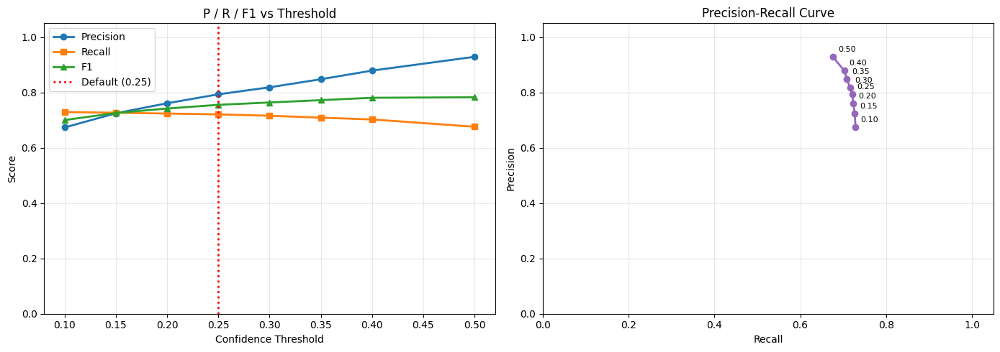

Recommended confidence for the SAM cascade: 0.30
Saved confidence plot: /home/vteam5/multispectral_pedestrian_ensemble/results_detection/confidence_sweep.png


In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(sweep_df["conf"], sweep_df["precision"], "o-", label="Precision", linewidth=2)
axes[0].plot(sweep_df["conf"], sweep_df["recall"], "s-", label="Recall", linewidth=2)
axes[0].plot(sweep_df["conf"], sweep_df["f1"], "^-", label="F1", linewidth=2)
axes[0].axvline(conf_default, color="red", linestyle=":", linewidth=2, label=f"Default ({conf_default:.2f})")
axes[0].set_xlabel("Confidence Threshold"); axes[0].set_ylabel("Score")
axes[0].set_title("P / R / F1 vs Threshold")
axes[0].legend(); axes[0].grid(alpha=0.3); axes[0].set_ylim(0, 1.05)

axes[1].plot(sweep_df["recall"], sweep_df["precision"], "o-", color="tab:purple", linewidth=2)
for _, row in sweep_df.iterrows():
    axes[1].annotate(f"{row['conf']:.2f}", (row["recall"], row["precision"]),
                     fontsize=8, xytext=(5, 5), textcoords="offset points")
axes[1].set_xlabel("Recall"); axes[1].set_ylabel("Precision")
axes[1].set_title("Precision-Recall Curve")
axes[1].grid(alpha=0.3); axes[1].set_xlim(0, 1.05); axes[1].set_ylim(0, 1.05)

plt.tight_layout()
confidence_plot_path = detection_results_dir / "confidence_sweep.png"
plt.savefig(confidence_plot_path, dpi=150, bbox_inches="tight")
plt.show()

best_f1 = sweep_df["f1"].max()
candidates = sweep_df[sweep_df["f1"] >= best_f1 - 0.02]
selected_conf_for_cascade = float(candidates["conf"].min())
print(f"Recommended confidence for the SAM cascade: {selected_conf_for_cascade:.2f}")
print(f"Saved confidence plot: {confidence_plot_path}")


## Validation (V2 Improvement)


In [ ]:
val_model = YOLO(str(best_checkpoint_path))
metrics = val_model.val(
    data=str(data_yaml_path),
    imgsz=img_size,
    conf=conf_default,
    iou=nms_iou,
    device=compute_device,
)

map50 = float(metrics.box.map50)
map50_95 = float(metrics.box.map)
precision = float(metrics.box.mp)
recall = float(metrics.box.mr)

print("YOLO-only validation results")
print(f"mAP@50: {map50:.4f}")
print(f"mAP@50-95: {map50_95:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")

yolo_metrics_path = detection_results_dir / "yolo_baseline_metrics.json"
with open(yolo_metrics_path, "w") as f:
    json.dump({
        "model": yolo_model,
        "checkpoint_path": str(best_checkpoint_path),
        "image_size": img_size,
        "confidence_threshold": conf_default,
        "iou_threshold_nms": nms_iou,
        "mAP_at_0.50": map50,
        "mAP_at_0.50_to_0.95": map50_95,
        "precision": precision,
        "recall": recall,
    }, f, indent=2)
print(f"Saved YOLO metrics: {yolo_metrics_path}")


Ultralytics 8.4.45 🚀 Python-3.12.13 torch-2.6.0+cu124 CUDA:0 (Quadro RTX 4000, 7974MiB)
YOLO11s summary (fused): 101 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 7641.4±945.0 MB/s, size: 432.9 KB)
val: Scanning /home/vteam5/multispectral_pedestrian_ensemble/processed_dataset/val/labels.cache... 1804 images, 1 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1804/1804 540.5Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 113/113 3.3it/s 33.8s
                   all       1804       5057      0.927      0.888      0.881      0.445
Speed: 1.2ms preprocess, 15.5ms inference, 0.0ms loss, 0.4ms postprocess per image
Results saved to /home/vteam5/sam2/runs/detect/val-8
YOLO-only validation results
mAP@50: 0.8805
mAP@50-95: 0.4449
Precision: 0.9268
Recall: 0.8877
Saved YOLO metrics: /home/vteam5/multispectral_pedestrian_ensemble/results_detection/yolo_baseline_metrics.json

## Qualitative Samples (V2 Improvement)


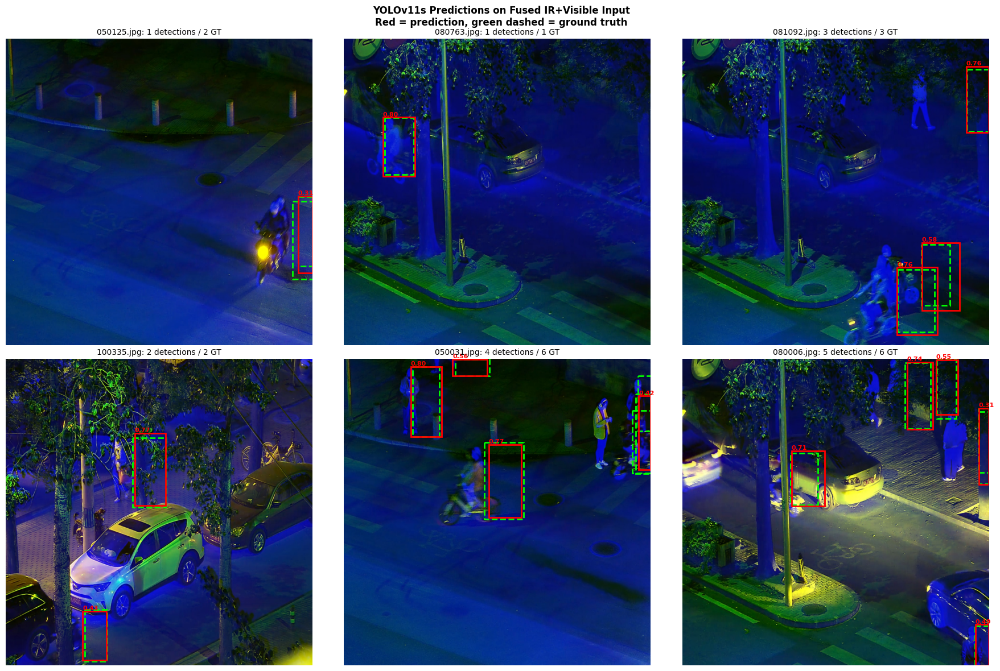

Saved YOLO qualitative samples: /home/vteam5/multispectral_pedestrian_ensemble/results_detection/qualitative_samples.png


In [ ]:
sample_indices = random.sample(range(len(val_images)), 6)
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
fig.suptitle("YOLOv11s Predictions on Fused IR+Visible Input\nRed = prediction, green dashed = ground truth",
             fontsize=12, fontweight="bold")
axes_flat = axes.flatten()

q_model = YOLO(str(best_checkpoint_path))

for pos, idx in enumerate(sample_indices):
    img_path = val_images[idx]
    img = cv2.cvtColor(cv2.imread(str(img_path)), cv2.COLOR_BGR2RGB)

    pred = q_model.predict(source=str(img_path), conf=conf_default, iou=nms_iou,
                           imgsz=img_size, verbose=False)
    boxes = pred[0].boxes.xyxy.cpu().numpy()
    confs = pred[0].boxes.conf.cpu().numpy()
    gt = load_gt(val_labels_dir / (img_path.stem + ".txt"), img_size)

    axes_flat[pos].imshow(img)
    for g in gt:
        rect = patches.Rectangle((g[0], g[1]), g[2]-g[0], g[3]-g[1],
                                 linewidth=2, edgecolor="lime", linestyle="--", facecolor="none")
        axes_flat[pos].add_patch(rect)
    for b, c in zip(boxes, confs):
        rect = patches.Rectangle((b[0], b[1]), b[2]-b[0], b[3]-b[1],
                                 linewidth=2, edgecolor="red", facecolor="none")
        axes_flat[pos].add_patch(rect)
        axes_flat[pos].text(b[0], b[1]-5, f"{c:.2f}", color="red",
                            fontsize=8, fontweight="bold")
    axes_flat[pos].set_title(f"{img_path.name}: {len(boxes)} detections / {len(gt)} GT", fontsize=10)
    axes_flat[pos].axis("off")

plt.tight_layout()
yolo_samples_path = detection_results_dir / "qualitative_samples.png"
plt.savefig(yolo_samples_path, dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved YOLO qualitative samples: {yolo_samples_path}")


## Bridge Export to SAM 2 (V2 Improvement)


### Save bbox detections in xyxy absolute pixels (V2 Improvement)


In [ ]:
export_model = YOLO(str(best_checkpoint_path))
export_dict = {
    "metadata": {
        "model": yolo_model,
        "checkpoint_path": str(best_checkpoint_path),
        "image_size": img_size,
        "confidence_threshold": conf_default,
        "iou_threshold_nms": nms_iou,
        "max_detections": max_det,
        "format": "xyxy_absolute_pixels",
        "num_images": len(val_images),
    },
    "detections": {},
}

total = 0
zero_count = 0
for i, img_path in enumerate(val_images):
    out = export_model.predict(source=str(img_path), conf=conf_default, iou=nms_iou,
                               imgsz=img_size, max_det=max_det, verbose=False)
    boxes = out[0].boxes.xyxy.cpu().numpy()
    confs = out[0].boxes.conf.cpu().numpy()

    export_dict["detections"][img_path.name] = {
        "image_size_hw": [img_size, img_size],
        "boxes_xyxy": boxes.round(2).tolist(),
        "confidences": confs.round(4).tolist(),
    }
    total += len(boxes)
    if len(boxes) == 0:
        zero_count += 1
    if (i + 1) % 200 == 0:
        print(f"{i+1}/{len(val_images)} images exported")

bridge_path = detection_results_dir / "yolo_detections.json"
with open(bridge_path, "w") as f:
    json.dump(export_dict, f, indent=2)

print("Bridge export complete")
print(f"Images: {len(val_images)}")
print(f"Detections: {total}")
print(f"Zero-detection images: {zero_count}")
print(f"Average detections per image: {total/len(val_images):.2f}")
print(f"Saved bridge file: {bridge_path}")


200/1804 images exported
400/1804 images exported
600/1804 images exported
800/1804 images exported
1000/1804 images exported
1200/1804 images exported
1400/1804 images exported
1600/1804 images exported
1800/1804 images exported
Bridge export complete
Images: 1804
Detections: 4595
Zero-detection images: 41
Average detections per image: 2.55
Saved bridge file: /home/vteam5/multispectral_pedestrian_ensemble/results_detection/yolo_detections.json


### SAM 2 Format Moving Downstream

```python
with open("yolo_detections.json") as f:
    bridge = json.load(f)

rec = bridge["detections"]["010001.jpg"]
boxes = np.array(rec["boxes_xyxy"])

sam2_pred.set_image(visible_rgb)
masks, iou_scores, _ = sam2_pred.predict(
    point_coords=None,
    point_labels=None,
    box=boxes,
    multimask_output=True,
)
```


## YOLO Detection Summary (V2 Improvement)


In [ ]:
print("YOLO detection summary")
print(f"Model: {yolo_model}")
print(f"Image size: {img_size}")
print(f"Confidence: {conf_default}")
print(f"NMS IoU: {nms_iou}")
print(f"mAP@50: {map50:.4f}")
print(f"mAP@50-95: {map50_95:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")

print("Saved YOLO artifacts")
for p in sorted(detection_results_dir.rglob("*")):
    if p.is_file() and p.suffix in (".csv", ".json", ".png"):
        print(f"  {p.relative_to(detection_results_dir)} ({p.stat().st_size/1e6:.2f} MB)")


YOLO detection summary
Model: yolo11s.pt
Image size: 1024
Confidence: 0.25
NMS IoU: 0.45
mAP@50: 0.8805
mAP@50-95: 0.4449
Precision: 0.9268
Recall: 0.8877
Saved YOLO artifacts
  confidence_sweep.csv (0.00 MB)
  confidence_sweep.png (0.08 MB)
  qualitative_samples.png (5.54 MB)
  training_curves.png (0.16 MB)
  yolo_baseline_metrics.json (0.00 MB)
  yolo_detections.json (1.00 MB)


# SAM 2


## Imports


In [ ]:
sys.path.insert(0, "/home/vteam5/sam2")
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

random.seed(42)
np.random.seed(42)
torch.manual_seed(42)


## Path Configuration


In [ ]:
sam2_checkpoint = model_checkpoints_dir / "sam2_hiera_large.pt"
SAM2_URL = "https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_large.pt"

if not sam2_checkpoint.exists():
    print("Downloading SAM 2 checkpoint. This only runs when the file is missing.")
    !wget -q --show-progress -O "{sam2_checkpoint}" "{SAM2_URL}"
    if not sam2_checkpoint.exists() or sam2_checkpoint.stat().st_size < 1e8:
        raise RuntimeError("SAM 2 checkpoint download failed. Re-run this cell or check connectivity.")
else:
    print("SAM 2 checkpoint already exists.")

print(f"Project root: {project_root}")
print(f"Ensemble results folder: {ensemble_results_dir}")


SAM 2 checkpoint already exists.
Project root: /home/vteam5/multispectral_pedestrian_ensemble
Ensemble results folder: /home/vteam5/multispectral_pedestrian_ensemble/results_ensemble_v2


## SAM 2 Setup


In [ ]:
SAM2_CONFIG = "configs/sam2.1/sam2.1_hiera_l.yaml"
print("Loading SAM 2 Hiera-Large.")
sam2_base = build_sam2(config_file=SAM2_CONFIG, ckpt_path=str(sam2_checkpoint), device=compute_device)
sam2_pred = SAM2ImagePredictor(sam2_base)
print("SAM 2 loaded.")


Loading SAM 2 Hiera-Large.
SAM 2 loaded.


In [ ]:
def choose_best_sam_mask(raw_masks, raw_iou, box_index):
    """Pick the highest-scoring SAM mask for one YOLO box."""
    masks = np.asarray(raw_masks)
    scores = np.asarray(raw_iou)

    if masks.ndim == 4:
        candidate_masks = masks[box_index]
        candidate_scores = scores[box_index].reshape(-1)
    elif masks.ndim == 3:
        candidate_masks = masks
        candidate_scores = scores.reshape(-1)
    else:
        candidate_masks = masks.reshape(1, *masks.shape[-2:])
        candidate_scores = scores.reshape(-1)

    best_index = int(np.argmax(candidate_scores)) if len(candidate_scores) else 0
    return candidate_masks[best_index].astype(bool), float(candidate_scores[best_index])


def mask_to_box(mask):
    rows, cols = np.where(mask)
    if len(rows) == 0:
        return None
    return [float(cols.min()), float(rows.min()), float(cols.max()), float(rows.max())]


In [ ]:
def validate_sam_mask(mask, yolo_box, min_area_ratio=0.05, max_area_ratio=1.25, min_box_iou=0.30):
    """Reject only masks that are clearly empty, too large, too tiny, or far from the YOLO box."""
    mask_box = mask_to_box(mask)
    if mask_box is None:
        return False, "empty_mask", None

    yolo_area = max(1.0, (yolo_box[2] - yolo_box[0]) * (yolo_box[3] - yolo_box[1]))
    mask_area = float(mask.sum())
    area_ratio = mask_area / yolo_area
    overlap = box_iou(mask_box, yolo_box)

    if area_ratio < min_area_ratio:
        return False, "mask_too_small", mask_box
    if area_ratio > max_area_ratio:
        return False, "mask_too_large", mask_box
    if overlap < min_box_iou:
        return False, "mask_far_from_box", mask_box
    return True, "kept", mask_box


## Veto Threshold Logic

In [ ]:
# SAM uses visible RGB because that is closer to the images it was trained on.
# YOLO still uses the fused image because the checkpoint was trained on fused inputs.
SAM_MASK_MIN_AREA_RATIO = 0.05
SAM_MASK_MAX_AREA_RATIO = 1.25
SAM_MASK_MIN_BOX_IOU = 0.30
cascade_conf = selected_conf_for_cascade if "selected_conf_for_cascade" in globals() else conf_default

print(f"Cascade confidence: {cascade_conf:.2f}")
print(f"Minimum mask/box area ratio: {SAM_MASK_MIN_AREA_RATIO:.2f}")
print(f"Maximum mask/box area ratio: {SAM_MASK_MAX_AREA_RATIO:.2f}")
print(f"Minimum mask-box IoU: {SAM_MASK_MIN_BOX_IOU:.2f}")


Cascade confidence: 0.30
Minimum mask/box area ratio: 0.05
Maximum mask/box area ratio: 1.25
Minimum mask-box IoU: 0.30


In [ ]:
def run_sam2_refinement(visible_rgb: np.ndarray, boxes_xyxy: np.ndarray):
    """Run SAM 2 on visible RGB and keep one checked mask per YOLO box."""
    if len(boxes_xyxy) == 0:
        return [], [], [], []

    kept_masks = []
    kept_scores = []
    kept_boxes = []
    veto_reasons = []

    with torch.inference_mode():
        sam2_pred.set_image(visible_rgb)
        raw_masks, raw_iou, _ = sam2_pred.predict(
            point_coords=None,
            point_labels=None,
            box=boxes_xyxy,
            multimask_output=True,
        )

    for box_index, yolo_box in enumerate(boxes_xyxy):
        mask, score = choose_best_sam_mask(raw_masks, raw_iou, box_index)
        keep, reason, mask_box = validate_sam_mask(
            mask,
            yolo_box,
            min_area_ratio=SAM_MASK_MIN_AREA_RATIO,
            max_area_ratio=SAM_MASK_MAX_AREA_RATIO,
            min_box_iou=SAM_MASK_MIN_BOX_IOU,
        )
        if keep:
            kept_masks.append(mask)
            kept_scores.append(score)
            kept_boxes.append(mask_box)
        else:
            veto_reasons.append(reason)

    return kept_masks, kept_scores, kept_boxes, veto_reasons


In [ ]:
def resize_visible_for_sam(vis_path: Path, res: int = TARGET_RES) -> np.ndarray:
    """Load the original visible image and resize it to match YOLO boxes."""
    visible_bgr = cv2.imread(str(vis_path))
    if visible_bgr is None:
        raise FileNotFoundError(f"Visible image not found: {vis_path}")
    visible_bgr = cv2.resize(visible_bgr, (res, res), interpolation=cv2.INTER_AREA)
    return cv2.cvtColor(visible_bgr, cv2.COLOR_BGR2RGB)


In [ ]:
veto_settings = {
    "cascade_confidence": cascade_conf,
    "min_area_ratio": SAM_MASK_MIN_AREA_RATIO,
    "max_area_ratio": SAM_MASK_MAX_AREA_RATIO,
    "min_box_iou": SAM_MASK_MIN_BOX_IOU,
    "sam_input": "original_visible_rgb_resized_to_1024",
}

veto_settings_path = ensemble_results_dir / "veto_settings.json"
with open(veto_settings_path, "w") as f:
    json.dump(veto_settings, f, indent=2)
print(f"Saved veto settings: {veto_settings_path}")


Saved veto settings: /home/vteam5/multispectral_pedestrian_ensemble/results_ensemble_v2/veto_settings.json


## Ensemble Pipeline


In [ ]:
def run_ensemble(fused_path: Path, ir_path: Path, vis_path: Path, yolo_model_obj,
                 conf: float = cascade_conf) -> dict:
    """Run YOLO on the fused image, then refine boxes with SAM 2 on visible RGB."""
    fused_bgr = cv2.imread(str(fused_path))
    if fused_bgr is None:
        raise FileNotFoundError(f"Fused image not found: {fused_path}")
    fused_rgb = cv2.cvtColor(fused_bgr, cv2.COLOR_BGR2RGB)

    ir_gray = cv2.imread(str(ir_path), cv2.IMREAD_GRAYSCALE)
    visible_rgb = resize_visible_for_sam(vis_path, TARGET_RES)

    preds = yolo_model_obj.predict(source=str(fused_path), conf=conf, iou=nms_iou,
                                   imgsz=TARGET_RES, max_det=max_det, verbose=False)
    boxes = preds[0].boxes.xyxy.cpu().numpy()
    confs = preds[0].boxes.conf.cpu().numpy()

    masks, scores, mask_boxes, veto_reasons = run_sam2_refinement(visible_rgb, boxes)

    return {
        "image_name": fused_path.name,
        "fused_image": fused_rgb,
        "infrared_image": ir_gray,
        "visible_image": visible_rgb,
        "yolo_boxes_xyxy": boxes,
        "yolo_conf": confs,
        "final_masks": masks,
        "final_scores": scores,
        "final_mask_boxes_xyxy": mask_boxes,
        "vetoed": len(veto_reasons),
        "veto_reasons": veto_reasons,
    }


# Ensemble Pipeline


In [ ]:
val_fused_paths = sorted((processed_dataset_dir / "val" / "images").glob("*.jpg"))
val_ir_paths = [llvip_infrared_train_dir / p.name for p in val_fused_paths]
val_vis_paths = [llvip_visible_train_dir / p.name for p in val_fused_paths]

print(f"Validation images for ensemble: {len(val_fused_paths)}")


Validation images for ensemble: 1804


In [ ]:
ensemble_yolo = YOLO(str(best_checkpoint_path))
all_results = []

for i, (fp, ip, vp) in enumerate(zip(val_fused_paths, val_ir_paths, val_vis_paths)):
    result = run_ensemble(fp, ip, vp, ensemble_yolo, conf=cascade_conf)
    all_results.append(result)
    if (i + 1) % 100 == 0:
        print(f"{i+1}/{len(val_fused_paths)} images processed")

print(f"Ensemble finished on {len(all_results)} images.")


100/1804 images processed
200/1804 images processed
300/1804 images processed
400/1804 images processed
500/1804 images processed
600/1804 images processed
700/1804 images processed
800/1804 images processed
900/1804 images processed
1000/1804 images processed
1100/1804 images processed
1200/1804 images processed
1300/1804 images processed
1400/1804 images processed
1500/1804 images processed
1600/1804 images processed
1700/1804 images processed
1800/1804 images processed
Ensemble finished on 1804 images.


In [ ]:
# Anoether heavy cell. Save in case runtime disconnects.

import json
import numpy as np
from pathlib import Path

# Ensure directory exists
ensemble_results_dir.mkdir(parents=True, exist_ok=True)
ensemble_results_cache_path = ensemble_results_dir / f"ensemble_results_cache_conf_{cascade_conf:.2f}.json"

ensemble_results_cache = {
    "metadata": {
        "cascade_conf": float(cascade_conf),
        "min_area_ratio": float(SAM_MASK_MIN_AREA_RATIO),
        "max_area_ratio": float(SAM_MASK_MAX_AREA_RATIO),
        "min_box_iou": float(SAM_MASK_MIN_BOX_IOU),
        "num_images": len(all_results),
        "image_size": int(TARGET_RES),
        "checkpoint_path": str(best_checkpoint_path),
    },
    "results": []
}

for res in all_results:
    # use .get() with empty lists as fallbacks to prevent the KeyError
    # if a specific image had zero detections.
    ensemble_results_cache["results"].append({
        "image_name": res["image_name"],
        "yolo_boxes_xyxy": np.asarray(res.get("yolo_boxes_xyxy", [])).tolist(),
        "yolo_conf": np.asarray(res.get("yolo_conf", [])).tolist(),
        "final_boxes_xyxy": np.asarray(res.get("final_boxes_xyxy", [])).tolist(),
        "final_mask_boxes_xyxy": np.asarray(res.get("final_mask_boxes_xyxy", [])).tolist(),
        "final_scores": np.asarray(res.get("final_scores", [])).tolist(),
        "vetoed": int(res.get("vetoed", 0)),
        "veto_reasons": res.get("veto_reasons", []),
    })

with open(ensemble_results_cache_path, "w") as f:
    json.dump(ensemble_results_cache, f, indent=2)

print(f"Successfully saved ensemble results: {ensemble_results_cache_path}")

Successfully saved ensemble results: /home/vteam5/multispectral_pedestrian_ensemble/results_ensemble_v2/ensemble_results_cache_conf_0.30.json


In [ ]:
# run only when runtime disconnects

import json
import numpy as np
import os

ensemble_results_cache_path = ensemble_results_dir / f"ensemble_results_cache_conf_{cascade_conf:.2f}.json"

if os.path.exists(ensemble_results_cache_path):
    print(f"🔄 Loading cache from {ensemble_results_cache_path}...")

    with open(ensemble_results_cache_path, "r") as f:
        cache_data = json.load(f)

    all_results = []
    for item in cache_data["results"]:
        all_results.append({
            "image_name": item["image_name"],
            "yolo_boxes_xyxy": np.array(item["yolo_boxes_xyxy"]),
            "yolo_conf": np.array(item["yolo_conf"]),
            "final_boxes_xyxy": np.array(item["final_boxes_xyxy"]),
            "final_mask_boxes_xyxy": np.array(item["final_mask_boxes_xyxy"]),
            "final_scores": np.array(item["final_scores"]),
            "vetoed": bool(item["vetoed"]),
            "veto_reasons": item["veto_reasons"]
        })

    # Sync metadata
    cascade_conf = cache_data["metadata"]["cascade_conf"]
    print(f"✅ Session restored. {len(all_results)} images loaded.")
else:
    print(f"⚠️ No cache file found at {ensemble_results_cache_path}.")

# Evaluation


In [ ]:
def count_matches(pred_boxes, gt_boxes, iou_thresh=0.50):
    """One prediction can match only one ground-truth box."""
    tp = 0
    matched = set()
    for pb in pred_boxes:
        best_iou, best_j = 0, -1
        for j, gb in enumerate(gt_boxes):
            if j in matched:
                continue
            v = box_iou(pb, gb)
            if v > best_iou:
                best_iou, best_j = v, j
        if best_iou >= iou_thresh and best_j >= 0:
            tp += 1
            matched.add(best_j)
    fp = len(pred_boxes) - tp
    fn = len(gt_boxes) - len(matched)
    return tp, fp, fn


def prf(tp, fp, fn):
    p = tp / (tp + fp) if tp + fp else 0
    r = tp / (tp + fn) if tp + fn else 0
    f = 2 * p * r / (p + r) if p + r else 0
    return p, r, f


In [ ]:
all_ious = []
yolo_tp = yolo_fp = yolo_fn = 0
ens_tp = ens_fp = ens_fn = 0
total_yolo_det = 0
total_veto_count = 0
veto_reason_counts = {}
per_image_rows = []

for i, res in enumerate(all_results):
    label_path = processed_dataset_dir / "val" / "labels" / (val_fused_paths[i].stem + ".txt")
    gt_boxes = load_gt(label_path, TARGET_RES)

    yolo_boxes = res["yolo_boxes_xyxy"].tolist()

    # For detection metrics, the ensemble keeps the original YOLO box
    # whenever its SAM mask survives validation.
    surviving_indices = []
    for box_index, _ in enumerate(res["final_masks"]):
        if box_index < len(yolo_boxes):
            surviving_indices.append(box_index)

    ensemble_boxes = [yolo_boxes[i] for i in surviving_indices]
    mask_boxes = [box for box in res["final_mask_boxes_xyxy"] if box is not None]

    y_tp, y_fp, y_fn = count_matches(yolo_boxes, gt_boxes)
    e_tp, e_fp, e_fn = count_matches(ensemble_boxes, gt_boxes)

    yolo_tp += y_tp; yolo_fp += y_fp; yolo_fn += y_fn
    ens_tp += e_tp; ens_fp += e_fp; ens_fn += e_fn
    total_yolo_det += len(yolo_boxes)
    total_veto_count += res["vetoed"]

    for reason in res["veto_reasons"]:
        veto_reason_counts[reason] = veto_reason_counts.get(reason, 0) + 1

    # Proxy mIoU still uses the SAM mask boxes, this is about mask localization.
    for pred_box in mask_boxes:
        if gt_boxes:
            all_ious.append(max(box_iou(pred_box, gb) for gb in gt_boxes))

    per_image_rows.append({
        "image": res["image_name"],
        "gt": len(gt_boxes),
        "yolo_det": len(yolo_boxes),
        "ensemble_masks": len(ensemble_boxes),
        "vetoed": res["vetoed"],
        "yolo_tp": y_tp,
        "yolo_fp": y_fp,
        "yolo_fn": y_fn,
        "ensemble_tp": e_tp,
        "ensemble_fp": e_fp,
        "ensemble_fn": e_fn,
    })


In [ ]:
yp, yr, yf = prf(yolo_tp, yolo_fp, yolo_fn)
ep, er, ef = prf(ens_tp, ens_fp, ens_fn)
proxy_miou = float(np.mean(all_ious)) if all_ious else 0.0
veto_rate = total_veto_count / total_yolo_det * 100 if total_yolo_det else 0.0

ensemble_metrics = {
    "cascade_confidence": cascade_conf,
    "yolo_precision_at_50": yp,
    "yolo_recall_at_50": yr,
    "yolo_f1_at_50": yf,
    "ensemble_precision_at_50": ep,
    "ensemble_recall_at_50": er,
    "ensemble_f1_at_50": ef,
    "ensemble_proxy_miou": proxy_miou,
    "veto_rate_percent": veto_rate,
    "total_yolo_detections": total_yolo_det,
    "total_vetoed": total_veto_count,
    "veto_reasons": veto_reason_counts,
}

metrics_path = ensemble_results_dir / "ensemble_metrics.json"
per_image_path = ensemble_results_dir / "ensemble_per_image_metrics.csv"
with open(metrics_path, "w") as f:
    json.dump(ensemble_metrics, f, indent=2)
pd.DataFrame(per_image_rows).to_csv(per_image_path, index=False)

print(f"Saved ensemble metrics: {metrics_path}")
print(f"Saved per-image metrics: {per_image_path}")


Saved ensemble metrics: /home/vteam5/multispectral_pedestrian_ensemble/results_ensemble_v2/ensemble_metrics.json
Saved per-image metrics: /home/vteam5/multispectral_pedestrian_ensemble/results_ensemble_v2/ensemble_per_image_metrics.csv


In [ ]:
print("Ensemble evaluation results")
print(f"{'Metric':<25} {'YOLO-only':>12} {'Ensemble':>12}")
print(f"{'Precision@50':<25} {yp:>12.4f} {ep:>12.4f}")
print(f"{'Recall@50':<25} {yr:>12.4f} {er:>12.4f}")
print(f"{'F1@50':<25} {yf:>12.4f} {ef:>12.4f}")
print(f"{'Proxy mIoU':<25} {'':>12} {proxy_miou:>12.4f}")
print(f"{'Veto Rate':<25} {'':>12} {veto_rate:>11.1f}%")

total_ensemble_det = total_yolo_det - total_veto_count
print(f"{'Total Detections':<25} {total_yolo_det:>12} {total_ensemble_det:>12}")

print("Veto reasons")
for reason, count in veto_reason_counts.items():
    print(f"  {reason}: {count}")


Ensemble evaluation results
Metric                       YOLO-only     Ensemble
Precision@50                    0.8184       0.8247
Recall@50                       0.7156       0.6929
F1@50                           0.7636       0.7531
Proxy mIoU                                   0.5738
Veto Rate                                      3.9%
Total Detections                  4422         4249
Veto reasons
  mask_far_from_box: 132
  mask_too_large: 24
  mask_too_small: 17


## Qualitative Visualisation (V2 Improvement)


In [ ]:
import random

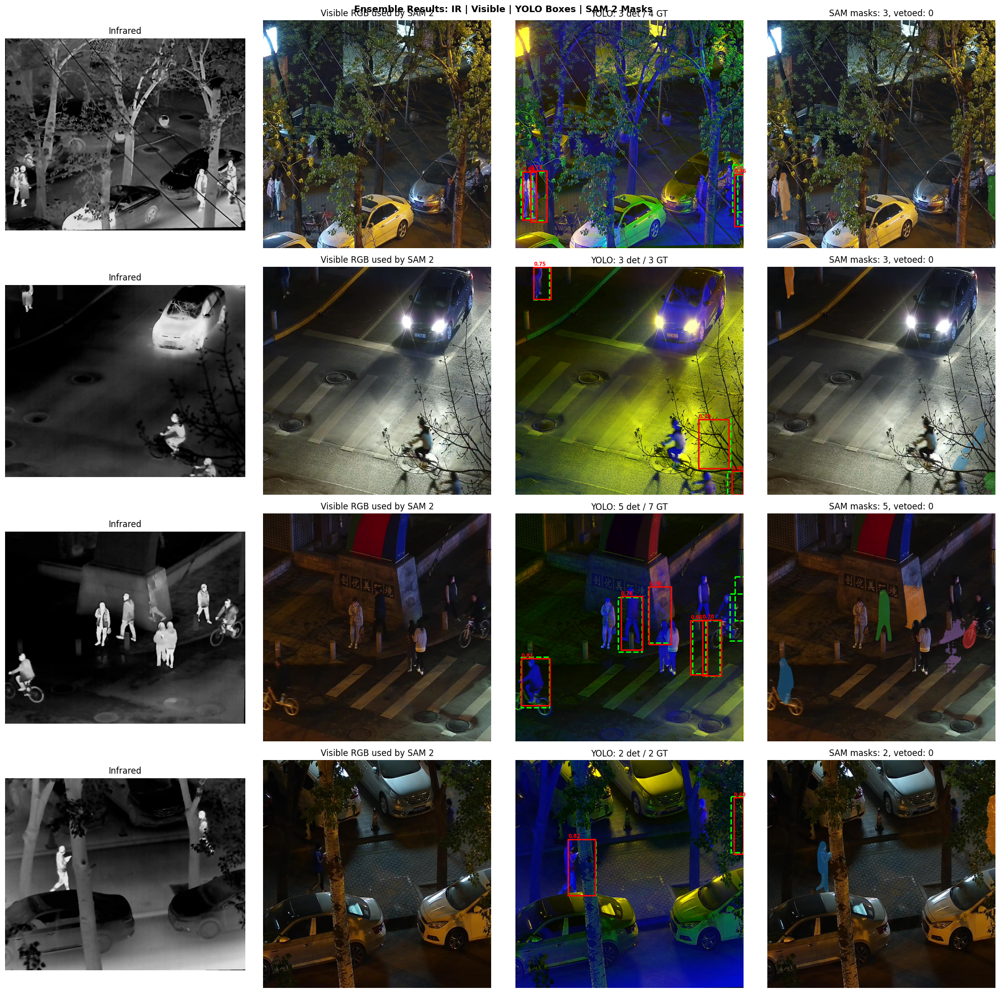

Saved ensemble qualitative plot: /home/vteam5/multispectral_pedestrian_ensemble/results_ensemble_v2/ensemble_qualitative.png


In [ ]:
sample_indices = random.sample(range(len(all_results)), min(4, len(all_results)))
fig, axes = plt.subplots(len(sample_indices), 4, figsize=(20, 5 * len(sample_indices)))
if len(sample_indices) == 1:
    axes = np.array([axes])
fig.suptitle("Ensemble Results: IR | Visible | YOLO Boxes | SAM 2 Masks", fontsize=13, fontweight="bold")
COLORS = plt.cm.tab10.colors

for row, idx in enumerate(sample_indices):
    res = all_results[idx]
    gt = load_gt(processed_dataset_dir / "val" / "labels" / (val_fused_paths[idx].stem + ".txt"), TARGET_RES)

    axes[row, 0].imshow(res["infrared_image"], cmap="gray")
    axes[row, 0].set_title("Infrared")
    axes[row, 0].axis("off")

    axes[row, 1].imshow(res["visible_image"])
    axes[row, 1].set_title("Visible RGB used by SAM 2")
    axes[row, 1].axis("off")

    axes[row, 2].imshow(res["fused_image"])
    for gb in gt:
        axes[row, 2].add_patch(patches.Rectangle((gb[0], gb[1]), gb[2]-gb[0], gb[3]-gb[1],
                               lw=2, edgecolor="lime", linestyle="--", facecolor="none"))
    for b, c in zip(res["yolo_boxes_xyxy"], res["yolo_conf"]):
        axes[row, 2].add_patch(patches.Rectangle((b[0], b[1]), b[2]-b[0], b[3]-b[1],
                               lw=2, edgecolor="red", facecolor="none"))
        axes[row, 2].text(b[0], b[1]-5, f"{c:.2f}", color="red", fontsize=7, fontweight="bold")
    axes[row, 2].set_title(f"YOLO: {len(res['yolo_boxes_xyxy'])} det / {len(gt)} GT")
    axes[row, 2].axis("off")

    overlay = res["visible_image"].copy()
    for mi, mask in enumerate(res["final_masks"]):
        color = np.array(COLORS[mi % len(COLORS)][:3]) * 255
        overlay[mask] = (overlay[mask] * 0.5 + color * 0.5).astype(np.uint8)
    axes[row, 3].imshow(overlay)
    axes[row, 3].set_title(f"SAM masks: {len(res['final_masks'])}, vetoed: {res['vetoed']}")
    axes[row, 3].axis("off")

plt.tight_layout()
ensemble_plot_path = ensemble_results_dir / "ensemble_qualitative.png"
plt.savefig(ensemble_plot_path, dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved ensemble qualitative plot: {ensemble_plot_path}")


# SAM 2 Bridge Export


In [ ]:
ensemble_export = {
    "metadata": {
        "checkpoint_path": str(best_checkpoint_path),
        "sam_input": "visible_rgb",
        "image_size": TARGET_RES,
        "confidence_threshold": cascade_conf,
        "mask_validation": veto_settings,
        "format": "boxes_xyxy_absolute_pixels",
        "num_images": len(all_results),
    },
    "results": {},
}

for res in all_results:
    ensemble_export["results"][res["image_name"]] = {
        "yolo_boxes_xyxy": np.asarray(res["yolo_boxes_xyxy"]).round(2).tolist(),
        "yolo_confidences": np.asarray(res["yolo_conf"]).round(4).tolist(),
        "sam_mask_boxes_xyxy": np.asarray(res["final_mask_boxes_xyxy"]).round(2).tolist(),
        "sam_scores": np.asarray(res["final_scores"]).round(4).tolist(),
        "vetoed": res["vetoed"],
        "veto_reasons": res["veto_reasons"],
    }

ensemble_bridge_path = ensemble_results_dir / "ensemble_bridge_results.json"
with open(ensemble_bridge_path, "w") as f:
    json.dump(ensemble_export, f, indent=2)
print(f"Saved ensemble bridge file: {ensemble_bridge_path}")


Saved ensemble bridge file: /home/vteam5/multispectral_pedestrian_ensemble/results_ensemble_v2/ensemble_bridge_results.json


# Final Summary


In [ ]:
print("Multispectral pedestrian project summary")
print(f"Model: {yolo_model}")
print(f"Checkpoint: {best_checkpoint_path}")
print(f"Image size: {img_size}")
print(f"YOLO validation confidence: {conf_default}")
print(f"Cascade confidence: {cascade_conf}")
print(f"YOLO mAP@50: {map50:.4f}")
print(f"YOLO mAP@50-95: {map50_95:.4f}")
print(f"YOLO validation precision: {precision:.4f}")
print(f"YOLO validation recall: {recall:.4f}")
print(f"Head-to-head YOLO F1@50: {yf:.4f}")
print(f"Head-to-head ensemble F1@50: {ef:.4f}")
print(f"Ensemble proxy mIoU: {proxy_miou:.4f}")
print(f"Veto rate: {veto_rate:.1f}%")

print("Saved artifacts")
for folder in [detection_results_dir, ensemble_results_dir]:
    print(f"Folder: {folder}")
    for p in sorted(folder.rglob("*")):
        if p.is_file() and p.suffix in (".csv", ".json", ".png", ".pt"):
            print(f"  {p.relative_to(folder)} ({p.stat().st_size/1e6:.2f} MB)")

Multispectral pedestrian project summary
Model: yolo11s.pt
Checkpoint: /home/vteam5/multispectral_pedestrian_ensemble/results/pedestrian_multispectral_yolo11s/weights/best.pt
Image size: 1024
YOLO validation confidence: 0.25
Cascade confidence: 0.3
YOLO mAP@50: 0.8805
YOLO mAP@50-95: 0.4449
YOLO validation precision: 0.9268
YOLO validation recall: 0.8877
Head-to-head YOLO F1@50: 0.7636
Head-to-head ensemble F1@50: 0.7531
Ensemble proxy mIoU: 0.5738
Veto rate: 3.9%
Saved artifacts
Folder: /home/vteam5/multispectral_pedestrian_ensemble/results_detection
  confidence_sweep.csv (0.00 MB)
  confidence_sweep.png (0.08 MB)
  qualitative_samples.png (5.54 MB)
  training_curves.png (0.16 MB)
  yolo_baseline_metrics.json (0.00 MB)
  yolo_detections.json (1.00 MB)
Folder: /home/vteam5/multispectral_pedestrian_ensemble/results_ensemble_v2
  ensemble_bridge_results.json (1.53 MB)
  ensemble_metrics.json (0.00 MB)
  ensemble_per_image_metrics.csv (0.06 MB)
  ensemble_qualitative.png (7.55 MB)
  ense